In [2]:
import pandas as pd

In [3]:
xl_file = pd.ExcelFile('~/Downloads/MiddleEast_2015-2022_Dec02.xlsx')
dfs = {sheet_name: xl_file.parse(sheet_name) for sheet_name in xl_file.sheet_names}

In [159]:
dfs.keys()

dict_keys(['Sheet1'])

In [ ]:
df = dfs['Sheet1']

In [157]:
df.shape

(329780, 31)

In [158]:
df.head()

,ISO,EVENT_ID_CNTY,EVENT_ID_NO_CNTY,EVENT_DATE,YEAR,TIME_PRECISION,EVENT_TYPE,SUB_EVENT_TYPE,ACTOR1,ASSOC_ACTOR_1,...,LATITUDE,LONGITUDE,GEO_PRECISION,SOURCE,SOURCE_SCALE,NOTES,FATALITIES,TIMESTAMP,MONTH,DAY
0,48,BHR326,326,2016-01-01,2016,1,Riots,Violent demonstration,Rioters (Bahrain),NaN,...,26.155,50.621,1,Press TV,Regional,Clashes erupted between police and demonstrato...,0,1572403770,1,1
1,48,BHR324,324,2016-01-01,2016,1,Protests,Peaceful protest,Protesters (Bahrain),NaN,...,26.133,50.609,1,Press TV,Regional,Small protest have been held in the village of...,0,1618526539,1,1
2,48,BHR323,323,2016-01-01,2016,1,Protests,Peaceful protest,Protesters (Bahrain),NaN,...,26.218,50.471,1,Press TV,Regional,Small protest have been held in the village of...,0,1603755484,1,1
3,48,BHR325,325,2016-01-01,2016,1,Protests,Peaceful protest,Protesters (Bahrain),NaN,...,26.183,50.585,1,Press TV,Regional,Small protest have been held in the village of...,0,1607976995,1,1
4,48,BHR328,328,2016-01-01,2016,1,Protests,Excessive force against protesters,Protesters (Bahrain),NaN,...,26.215,50.507,1,Middle East Eye,International,Bahrainis took part in an anti-regime protest ...,0,1615250536,1,1


In [24]:
# explore the data including string columns
df.describe(include='all')

/var/folders/2q/y6tqndfj1yqfc7hcdp99tz_00000gn/T/ipykernel_33504/3773152490.py:2: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df.describe(include='all')


,ISO,EVENT_ID_CNTY,EVENT_ID_NO_CNTY,EVENT_DATE,YEAR,TIME_PRECISION,EVENT_TYPE,SUB_EVENT_TYPE,ACTOR1,ASSOC_ACTOR_1,...,ADMIN3,LOCATION,LATITUDE,LONGITUDE,GEO_PRECISION,SOURCE,SOURCE_SCALE,NOTES,FATALITIES,TIMESTAMP
count,329780.000000,329780,329780.000000,329780,329780.000000,329780.000000,329780,329780,329780,99354,...,176182,329780,329780.000000,329780.000000,329780.000000,329780,329780,329780,329780.000000,3.297800e+05
unique,NaN,329780,NaN,2893,NaN,NaN,6,25,1413,6614,...,832,14270,NaN,NaN,NaN,19663,26,309044,NaN,NaN
top,NaN,BHR326,NaN,2019-05-31 00:00:00,NaN,NaN,Explosions/Remote violence,Peaceful protest,Military Forces of Syria (2000-),Labour Group (Iran),...,Central,Hays,NaN,NaN,NaN,SOHR,National,Coalition airstrikes hit unknown in Sirwah,NaN,NaN
freq,NaN,1,NaN,381,NaN,NaN,136881,66119,38316,8846,...,19262,1826,NaN,NaN,NaN,42006,96798,109,NaN,NaN
first,NaN,NaN,NaN,2015-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
last,NaN,NaN,NaN,2022-12-02 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,642.607174,NaN,32789.998632,NaN,2018.905382,1.040548,NaN,NaN,NaN,NaN,...,NaN,NaN,29.873496,40.858483,1.379171,NaN,NaN,NaN,1.237649,1.630600e+09
std,239.850648,NaN,28652.794390,NaN,1.986685,0.214702,NaN,NaN,NaN,NaN,...,NaN,NaN,8.788601,5.401463,0.554946,NaN,NaN,NaN,4.911294,2.639147e+07
min,48.000000,NaN,1.000000,NaN,2015.000000,1.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,12.194000,25.909000,0.000000,NaN,NaN,NaN,0.000000,1.552576e+09
25%,368.000000,NaN,9526.000000,NaN,2017.000000,1.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,26.133000,36.464000,1.000000,NaN,NaN,NaN,0.000000,1.618581e+09


In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

<AxesSubplot: xlabel='count', ylabel='COUNTRY'>

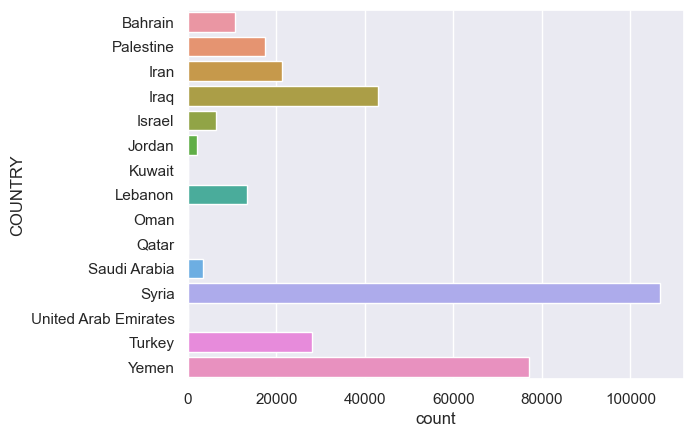

In [27]:
# count plot of `COUNTRY`
sns.countplot(y='COUNTRY', data=df)

<AxesSubplot: xlabel='count', ylabel='YEAR'>

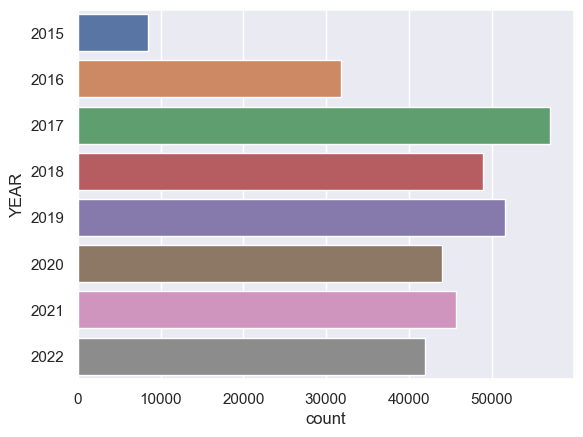

In [30]:
# count plot of `COUNTRY` with `YEAR` hue
sns.countplot(y='YEAR', data=df)

In [35]:
# cast `EVENT_DATE` to three columns `YEAR`, `MONTH`, `DAY`
df['EVENT_DATE'] = pd.to_datetime(df['EVENT_DATE'])
df['YEAR'] = df['EVENT_DATE'].dt.year
df['MONTH'] = df['EVENT_DATE'].dt.month
df['DAY'] = df['EVENT_DATE'].dt.day

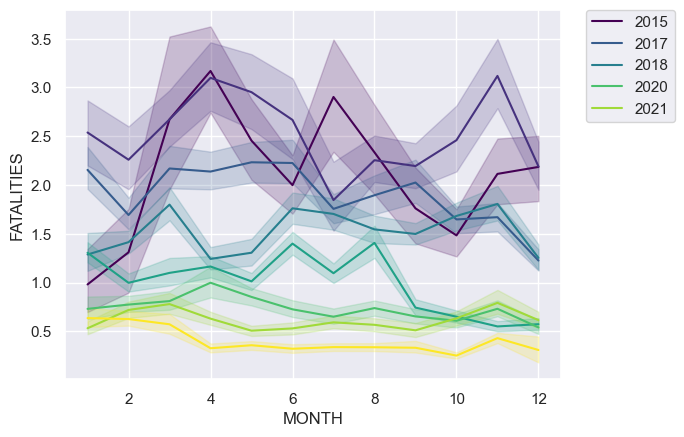

In [44]:
# plot smooth line by month and hue by year color map of `viridis`
sns.lineplot(x='MONTH', y='FATALITIES', hue='YEAR', data=df, palette='viridis')
# move legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

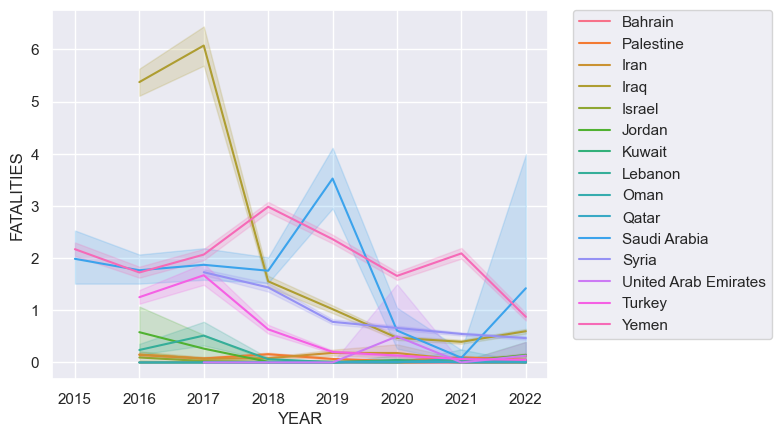

In [45]:
# plot `FATALITIES` by `YEAR` and hue by `COUNTRY`
sns.lineplot(x='YEAR', y='FATALITIES', hue='COUNTRY', data=df)
# move legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [48]:
# use plotly for interactive plots
import plotly.express as px

# plot `FATALITIES` by `YEAR` and color by `COUNTRY`
fig = px.scatter(df, x='YEAR', y='FATALITIES', color='COUNTRY')
fig.show()

In [51]:
dfi = df[df.COUNTRY == 'Iran']

In [160]:
dfi.shape

(21285, 31)

<AxesSubplot: xlabel='EVENT_DATE', ylabel='FATALITIES'>

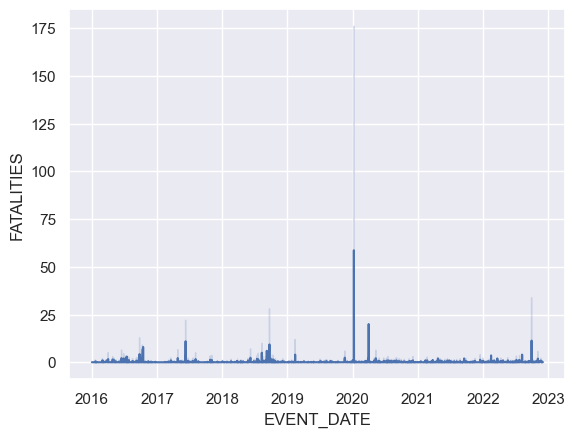

In [59]:
# count of `FATALITIES` through `EVENT_DATE` (datetime)
sns.lineplot(x='EVENT_DATE', y='FATALITIES', data=dfi)

<AxesSubplot: xlabel='count', ylabel='EVENT_TYPE'>

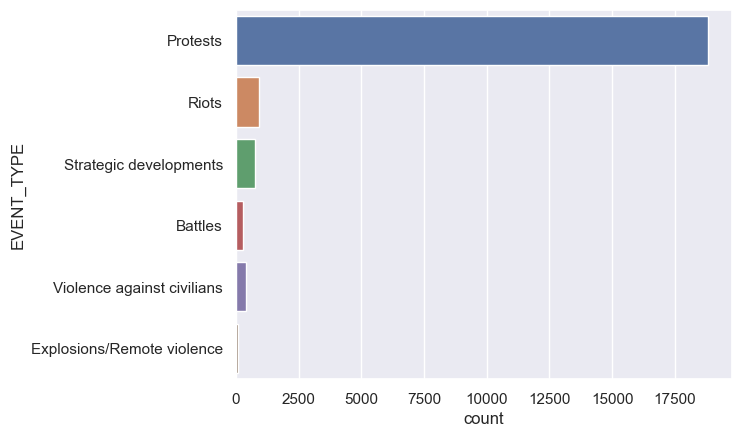

In [71]:
# count plot `EVENT_TYPE`
sns.countplot(y='EVENT_TYPE', data=dfi)

<AxesSubplot: xlabel='EVENT_TYPE', ylabel='COUNTRY'>

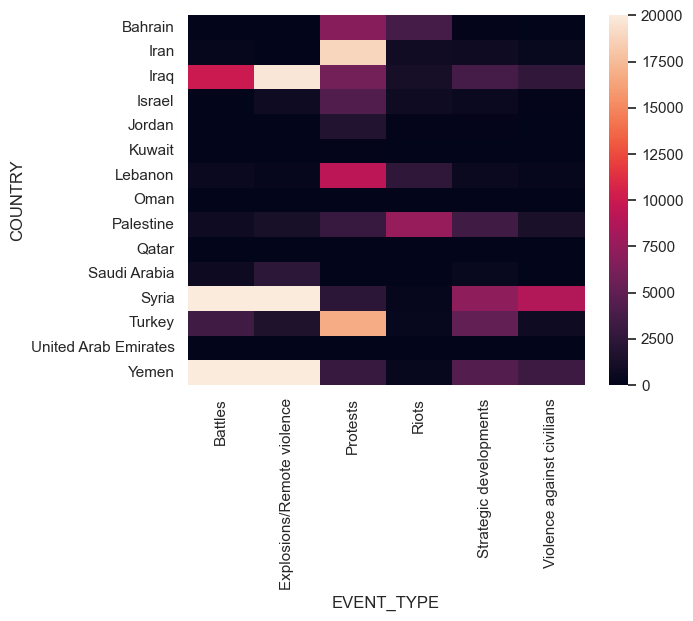

In [68]:
# heatmap of `EVENT_TYPE` count by `COUNTRY`
sns.heatmap(pd.crosstab(df['COUNTRY'], df['EVENT_TYPE']), vmin=0, vmax=20_000)

<AxesSubplot: xlabel='FATALITIES', ylabel='EVENT_TYPE'>

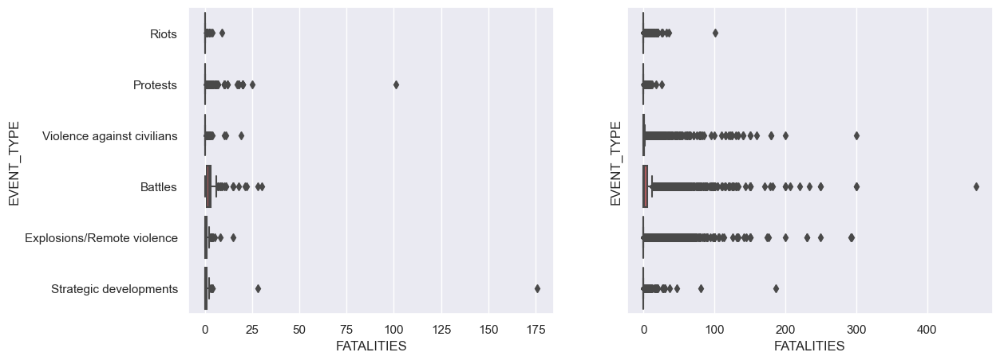

In [98]:
# make side-by-side boxplots of `FATALITIES` by `EVENT_TYPE`
# share y-axis; set figure size
fig, ax = plt.subplots(1, 2, sharey=True, figsize=(13, 5))
sns.boxplot(x='FATALITIES', y='EVENT_TYPE', data=dfi, ax=ax[0])
sns.boxplot(x='FATALITIES', y='EVENT_TYPE', data=df, ax=ax[1])

In [161]:
# past month in Iran
dfi[dfi['EVENT_DATE'] > pd.Timestamp('2022-11-01')].shape

(500, 31)

In [162]:
# looking for exact time
dfi[dfi.NOTES.str.contains('Mahsa Amini')].head(1)

,ISO,EVENT_ID_CNTY,EVENT_ID_NO_CNTY,EVENT_DATE,YEAR,TIME_PRECISION,EVENT_TYPE,SUB_EVENT_TYPE,ACTOR1,ASSOC_ACTOR_1,...,LATITUDE,LONGITUDE,GEO_PRECISION,SOURCE,SOURCE_SCALE,NOTES,FATALITIES,TIMESTAMP,MONTH,DAY
47620,364,IRN19759,19759,2022-09-16,2022,1,Protests,Protest with intervention,Protesters (Iran),Women (Iran),...,35.725,51.403,1,Iran International,International,"On 16 September 2022, residents of the city, f...",0,1670281610,9,16


In [87]:
"""
On 16 September 2022, residents of the city, feminist activists, and sympathizers protested in Argentina Square near Kasra Hospital in Tehran - District 6 (Tehran) over Mahsa Amini's death. Protes...
"""

"\nOn 16 September 2022, residents of the city, feminist activists, and sympathizers protested in Argentina Square near Kasra Hospital in Tehran - District 6 (Tehran) over Mahsa Amini's death. Protes...\n"

In [165]:
dfi[dfi.NOTES.str.contains('Mahsa Amini')].shape

(872, 31)

till Dec 2nd 2022

In [ ]:
"""
Around 21 September 2022, rioters attacked an IRGC post in Rey city (Tehran) as part of the ongoing demonstrations following Mahsa Amini's death. During the course of the riot, a 14 year old Afgha...
"""

<AxesSubplot: xlabel='count', ylabel='SOURCE'>

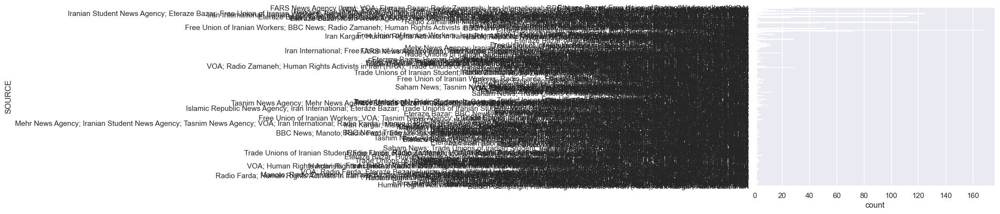

In [133]:
# count plot `SOURCE` in past month
sns.countplot(y='SOURCE', data=dfi[dfi['EVENT_DATE'] > pd.Timestamp('2022-09-16')])

In [134]:
# fix it to see sources
dfi[dfi['EVENT_DATE'] > pd.Timestamp('2022-09-16')]['SOURCE']
# separate values with `;`
dfi[dfi['EVENT_DATE'] > pd.Timestamp('2022-09-16')]['SOURCE'].str.split(';')
# concat all values into one list
dfi[dfi['EVENT_DATE'] > pd.Timestamp('2022-09-16')]['SOURCE'].str.split(';').sum()
# count values
pd.Series(dfi[dfi['EVENT_DATE'] > pd.Timestamp('2022-09-16')]['SOURCE'].str.split(';').sum()).value_counts()

Eteraze Bazar                                           319
Trade Unions of Iranian Student                         234
 Eteraze Bazar                                          212
Iran International                                      204
Human Rights Activists in Iran (HRA)                    191
 Trade Unions of Iranian Student                        189
 Iran International                                     133
 Human Rights Activists in Iran (HRA)                   129
 Free Union of Iranian Workers                          121
Iran Kargar                                             112
 Iran Kargar                                             88
Free Union of Iranian Workers                            87
VOA                                                      85
Radio Farda                                              83
 VOA                                                     83
 Radio Zamaneh                                           77
 Radio Farda                            

<AxesSubplot: xlabel='count', ylabel='SUB_EVENT_TYPE'>

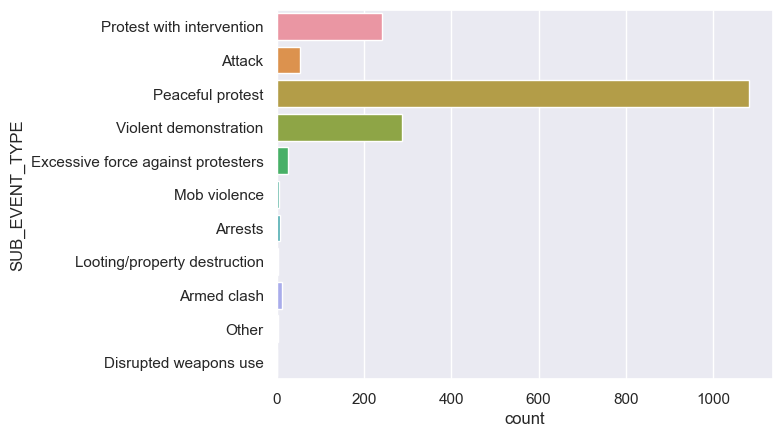

In [135]:
# count plot `SUB_EVENT_TYPE` in past month
sns.countplot(y='SUB_EVENT_TYPE', data=dfi[dfi['EVENT_DATE'] > pd.Timestamp('2022-09-16')])

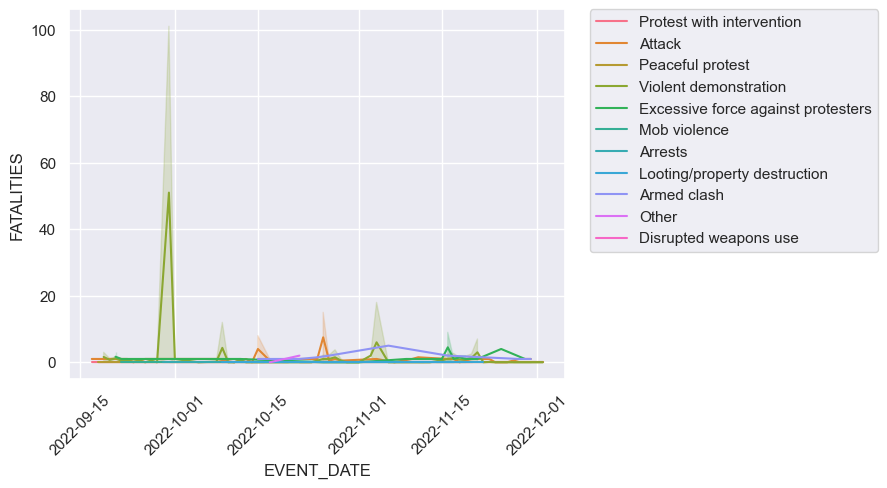

In [136]:
# scatter/line plot of `FATALITIES` and count with hue by `SUB_EVENT_TYPE` in past month
sns.lineplot(x='EVENT_DATE', y='FATALITIES', hue='SUB_EVENT_TYPE',
             data=dfi[dfi['EVENT_DATE'] > pd.Timestamp('2022-09-16')])
# legends outside the plot; rotate x labels
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


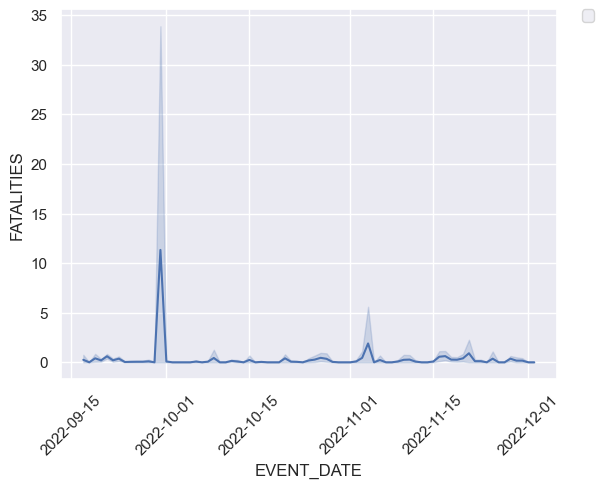

In [137]:
# scatter/line plot of `FATALITIES`  in past month
sns.lineplot(x='EVENT_DATE', y='FATALITIES',
             data=dfi[dfi['EVENT_DATE'] > pd.Timestamp('2022-09-16')])
# legends outside the plot; rotate x labels
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45)
plt.show()

In [142]:
# rows after 2022-09-16
dfi[dfi['EVENT_DATE'] > pd.Timestamp('2022-09-16')]
# find top 10 `ADMIN1` with most `FATALITIES`
# put them in a list
topProvinces = dfi[dfi['EVENT_DATE'] > pd.Timestamp('2022-09-16')
].groupby('ADMIN1')['FATALITIES'].sum().sort_values(ascending=False).head(10).index.tolist()
topProvinces

['Sistan and Baluchestan',
 'West Azerbaijan',
 'Kurdistan',
 'Tehran',
 'Gilan',
 'Kermanshah',
 'Fars',
 'Mazandaran',
 'Khuzestan',
 'Alborz']

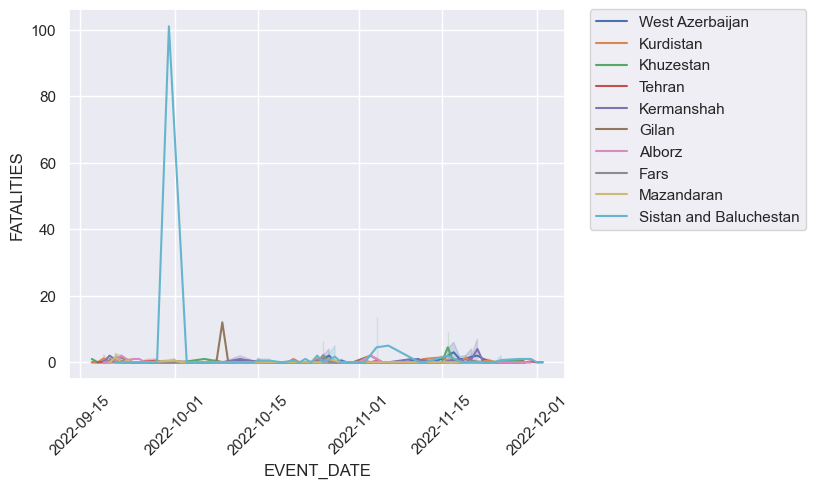

In [141]:
# scatter/line plot of `FATALITIES`
# after 2022-09-16 and hue by `ADMIN1` in top 10 provinces
sns.lineplot(x='EVENT_DATE', y='FATALITIES', hue='ADMIN1',
             data=dfi[
                 (dfi['EVENT_DATE'] > pd.Timestamp('2022-09-16'))
                 &
                 (dfi['ADMIN1'].isin(topProvinces))
             ])

# legends outside the plot; rotate x labels
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45)
plt.show()

poor Sistan o Baluchestan:

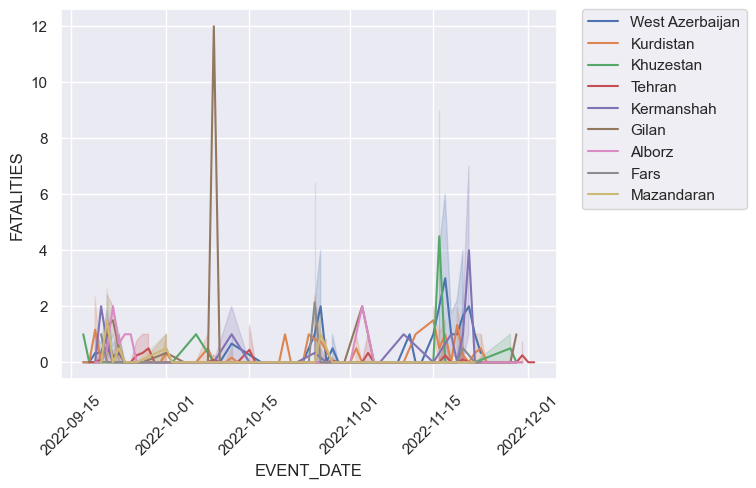

In [144]:
# scatter/line plot of `FATALITIES`
# after 2022-09-16 and hue by `ADMIN1` in top 10 provinces except `Sistan and Baluchistan`
sns.lineplot(x='EVENT_DATE', y='FATALITIES', hue='ADMIN1',
             data=dfi[
                 (dfi['EVENT_DATE'] > pd.Timestamp('2022-09-16'))
                 &
                 (dfi['ADMIN1'].isin(topProvinces))
                 &
                 (dfi['ADMIN1'] != 'Sistan and Baluchestan')
             ])

# legends outside the plot; rotate x labels
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45)
plt.show()

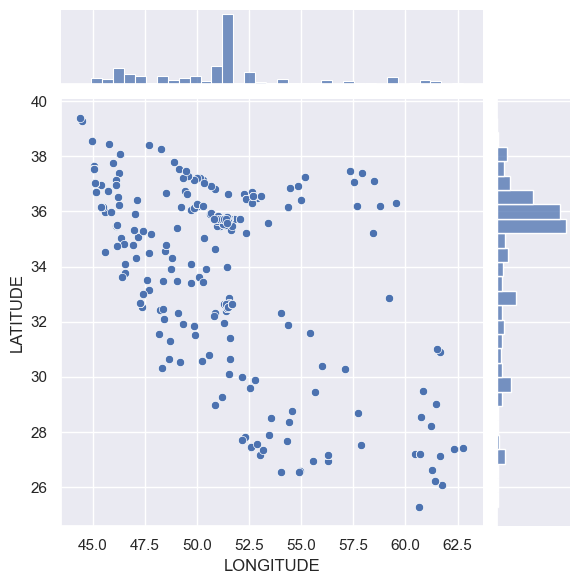

In [168]:
# plot jointplot of past month in `LONGITUDE` and `LATITUDE`
sns.jointplot(x='LONGITUDE', y='LATITUDE',
              data=dfi[dfi['EVENT_DATE'] > pd.Timestamp('2022-09-16')])